In [1]:
!pip install torch_geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 18.2 MB/s eta 0:00:00


In [2]:
from google.colab import drive
drive.mount('/content/drive')
import os
os.chdir("drive/MyDrive/ColabNotebooks/STAT_461")

Mounted at /content/drive


In [3]:
import os, gc, joblib, math, pandas as pd, numpy as np
from glob import glob
from tqdm.auto import tqdm, trange
from typing import Union, List
import matplotlib.pyplot as plt

import torch
from torch import nn, Tensor
import torch.optim as optim
import torch_geometric as pyg
from torch_geometric.loader import DataLoader
from scipy.optimize import root_scalar

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
pd.set_option("display.max_columns", 100)

# project-specific paths
PATH_DATA0 = "./data/00.01"   # graphs_train/val/test.pkl live here
PATH_DATA  = "./data/00.02"   # where we save models + stats
RANDOM_SEED = 0
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)

Using device: cpu


In [4]:
CRITERION     = nn.BCELoss()
LR            = 1e-3
TOLERANCE     = 20      # early-stop patience
LR_TOLERANCE  = 5       # epochs without val-improve before LR÷10
MAX_EPOCHS    = 200
BATCH_SIZE    = 2

In [5]:
loader_train = pyg.loader.DataLoader(
    pd.read_pickle(os.path.join(PATH_DATA0, 'graphs','max_prob_10_subsample_0.1','graphs_train.pkl')),
    batch_size = BATCH_SIZE,shuffle = True)
loader_val = pyg.loader.DataLoader(
    pd.read_pickle(os.path.join(PATH_DATA0, 'graphs','max_prob_10_subsample_0.1','graphs_val.pkl')),
    batch_size = BATCH_SIZE,shuffle = False)
loader_test = pyg.loader.DataLoader(
    pd.read_pickle(os.path.join(PATH_DATA0, 'graphs','max_prob_10_subsample_0.1','graphs_test.pkl')),
    batch_size = BATCH_SIZE,shuffle = False)

# Util Functions

In [6]:
def norm(x: Tensor) -> Tensor:
    r"""Euclidean square norm
    `\|x\|^2 = x[0]^2+x[1]^2+x[2]^2`
    """
    x_sq = torch.pow(x, 2)
    return x_sq.sum(dim=-1)


def dot(x: Tensor, y: Tensor) -> Tensor:
    r"""Euclidean inner product
    `<x,y> = x[0]y[0]+x[1]y[1]+x[2]y[2]`
    """
    xy = x * y
    return xy.sum(dim=-1)


def psi(x: Tensor) -> Tensor:
    """`\psi(x) = sgn(x) \cdot \log(|x| + 1)`"""
    return torch.sign(x) * torch.log(torch.abs(x) + 1)

def euclidean_feats(
    edge_index: Tensor, x: Tensor, s: Union[Tensor, None]
) -> List[Tensor]:
    i, j = edge_index
    x_diff = x[i] - x[j]
    norms = norm(x_diff).unsqueeze(1)
    dots = dot(x[i], x[j]).unsqueeze(1)
    norms, dots = psi(norms), psi(dots)

    # Handle first GNN iteration
    s_cat = torch.cat([s[i], s[j]], dim=1) if s is not None else None

    return norms, dots, x_diff, s_cat

def unsorted_segment_mean(
    data: Tensor, segment_ids: Tensor, num_segments: int
) -> Tensor:
    r"""Custom PyTorch op to replicate TensorFlow's `unsorted_segment_mean`.
    Adapted from https://github.com/vgsatorras/egnn.
    """
    result = data.new_zeros((num_segments, data.size(1)))
    count = data.new_zeros((num_segments, data.size(1)))
    result.index_add_(0, segment_ids, data)
    count.index_add_(0, segment_ids, torch.ones_like(data))
    return result / count.clamp(min=1)

# Model Architecture

In [7]:
class EB(nn.Module):
    def __init__(self, n_hidden: int = 32, c_weight: float = 1.0) -> None:
        super(EB, self).__init__()
        # dims for norm & inner product
        self.n_edge_attributes = 2
        # Controls the scale of x during updates
        self.c_weight = c_weight

        # MLP to create the message
        self.phi_e = nn.Sequential(
            nn.Linear(self.n_edge_attributes, n_hidden, bias=False),
            nn.BatchNorm1d(n_hidden),
            nn.ReLU(),
            nn.Linear(n_hidden, n_hidden),
            nn.ReLU(),
        )

        layer = nn.Linear(n_hidden, 1, bias=False)
        nn.init.xavier_uniform_(layer.weight, gain=0.001)
        # MLP to generate attention weights
        self.phi_x = nn.Sequential(nn.Linear(n_hidden, n_hidden), nn.ReLU(), layer)

        # MLP to generate weights for the messages
        self.phi_m = nn.Sequential(nn.Linear(n_hidden, 1), nn.Sigmoid())

    def message(self, norms, dots):
        m_ij = torch.cat([norms, dots], dim=1)
        m_ij = self.phi_e(m_ij)
        w = self.phi_m(m_ij)
        m_ij = m_ij * w
        return m_ij

    def x_model(self, x, edge_index, x_diff, m):
        i, j = edge_index
        update_val = x_diff * self.phi_x(m)
        # LorentzNet authors clamp the update tensor as a precautionary measure
        update_val = torch.clamp(update_val, min=-100, max=100)
        x_agg = unsorted_segment_mean(update_val, i, num_segments=x.size(0))
        x = x + x_agg * self.c_weight
        return x

    def forward(self, x, edge_index):
        norms, dots, x_diff, _ = euclidean_feats(edge_index, x, None)
        m = self.message(norms, dots)
        x_tilde = self.x_model(x, edge_index, x_diff, m)
        return x_tilde, m


class EuclidNet(nn.Module):
    def __init__(self, hparams) -> None:
        super(EuclidNet, self).__init__()

        self.hparams = hparams
        self.n_input = hparams["n_input"]
        self.n_output = hparams["n_output"]
        self.n_hidden = hparams["n_hidden"]
        self.n_layers = hparams["n_layers"]
        self.c_weight = hparams["c_weight"]

        self.EBs = nn.ModuleList(
            [
                EB(n_hidden=self.n_hidden, c_weight=self.c_weight)
                for _ in range(self.n_layers)
            ]
        )

        # MLP to produce edge weights
        self.edge_mlp = nn.Sequential(
            nn.Linear(2 * self.n_input + self.n_hidden, self.n_hidden),
            nn.ReLU(),
            nn.Linear(self.n_hidden, self.n_hidden),
            nn.ReLU(),
            nn.Linear(self.n_hidden, self.n_output),
        )

    def forward(self, x, edge_index):
        for i in range(self.n_layers):
            x, m_ij = self.EBs[i](x, edge_index)
        m = torch.cat([x[edge_index[1]], x[edge_index[0]], m_ij], dim=1)
        return torch.sigmoid(self.edge_mlp(m))

# Helper Functions

In [8]:
def count_parameters(model):
    """计算模型中可训练参数的数量"""
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return trainable_params

def evaluate(model, loader):
    """评估模型在给定数据加载器上的性能"""
    model.eval()
    preds, actuals = [], []
    with torch.no_grad():
        for batch in loader:
            batch = batch.to(device)
            # EuclidNet只需要x和edge_index，不需要edge_attr
            output = model(batch.x, batch.edge_index)
            preds.append(output)
            actuals.append(batch.y)
        preds = torch.cat(preds)
        actuals = torch.cat(actuals)
        acc = ((preds > 0.5) == (actuals > 0.5)).type(torch.float).mean().item()
        entropy = CRITERION(preds, actuals.float()).item()
    model.train()
    return preds.cpu().numpy(), actuals.cpu().numpy(), acc, entropy

def train_epoch(model, loader_train, optimizer):
    """训练一个epoch"""
    model.train()
    train_loss = 0.0
    for batch in tqdm(loader_train, leave=False):
        batch = batch.to(device)
        optimizer.zero_grad()
        # EuclidNet只需要x和edge_index
        output = model(batch.x, batch.edge_index)
        loss = CRITERION(output, batch.y.float())
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * batch.num_graphs
    train_loss /= len(loader_train)
    return train_loss

# Training Loop Function

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

训练 n_layers=2, target_params=100000
实际参数数量: 99952
Epoch | Train Loss |  Val Loss |  Val Acc |  Test Acc
--------------------------------------------------


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

    1 |     1.1472 |    0.6812 |   0.8000 |    0.8000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    2 |     1.1173 |    0.6658 |   0.8500 |    0.8500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    3 |     1.0809 |    0.6414 |   0.8500 |    0.8500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    4 |     1.0235 |    0.5988 |   0.7500 |    0.7500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    5 |     0.9346 |    0.5352 |   0.7500 |    0.7500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    6 |     0.8095 |    0.4488 |   0.8000 |    0.8000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    7 |     0.6715 |    0.3570 |   0.9000 |    0.9000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    8 |     0.5392 |    0.2992 |   0.9000 |    0.9000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    9 |     0.4175 |    0.2144 |   0.9000 |    0.9000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   10 |     0.3027 |    0.1598 |   0.9500 |    0.9500 *


  0%|          | 0/3 [00:00<?, ?it/s]

   11 |     0.2010 |    0.1080 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   12 |     0.1089 |    0.0482 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   13 |     0.0430 |    0.0178 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   14 |     0.0138 |    0.0106 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   15 |     0.0058 |    0.0045 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   16 |     0.0020 |    0.0014 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   17 |     0.0010 |    0.0006 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   18 |     0.0007 |    0.0004 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   19 |     0.0003 |    0.0003 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   20 |     0.0002 |    0.0003 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   21 |     0.0001 |    0.0002 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   22 |     0.0001 |    0.0001 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   23 |     0.0001 |    0.0001 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   24 |     0.0001 |    0.0001 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   25 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   26 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   27 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   28 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   29 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   30 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   31 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   32 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   33 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   34 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   35 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   36 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   37 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   38 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   39 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   40 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   41 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   42 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   43 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   44 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   45 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   46 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   47 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   48 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   49 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   50 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   51 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   52 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   53 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   54 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   55 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   56 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   57 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   58 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   59 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   60 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   61 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   62 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   63 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   64 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   65 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   66 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   67 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   68 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   69 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   70 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   71 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   72 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   73 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   74 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   75 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   76 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   77 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   78 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   79 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   80 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   81 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   82 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   83 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   84 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   85 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   86 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   87 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   88 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   89 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   90 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   91 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   92 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   93 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   94 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   95 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   96 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   97 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   98 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   99 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  100 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  101 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  102 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  103 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  104 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  105 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  106 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  107 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  108 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  109 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  110 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  111 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  112 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  113 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  114 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  115 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  116 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  117 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  118 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  119 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  120 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  121 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  122 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  123 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  124 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  125 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  126 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  127 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  128 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  129 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  130 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  131 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  132 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  133 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  134 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  135 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  136 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  137 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  138 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  139 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  140 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  141 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  142 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  143 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  144 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  145 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  146 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  147 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  148 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  149 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  150 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  151 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  152 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  153 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  154 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  155 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  156 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  157 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  158 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  159 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  160 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  161 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  162 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  163 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  164 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  165 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  166 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  167 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  168 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  169 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  170 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  171 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  172 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  173 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  174 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  175 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  176 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  177 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  178 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  179 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  180 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  181 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  182 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  183 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  184 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  185 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  186 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  187 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  188 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  189 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  190 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  191 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  192 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  193 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  194 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  195 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  196 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  197 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  198 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  199 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  200 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


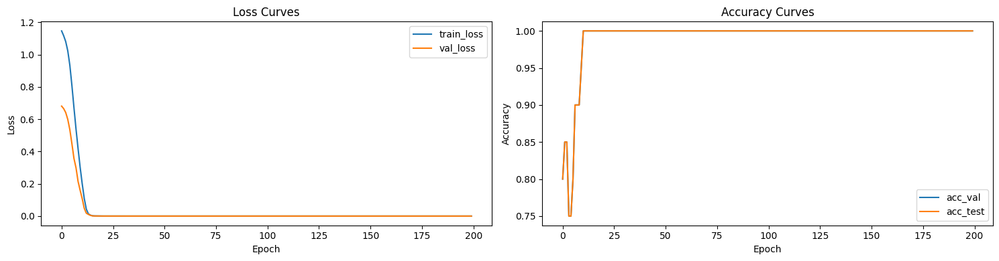

训练 n_layers=2, target_params=500000
实际参数数量: 501392
Epoch | Train Loss |  Val Loss |  Val Acc |  Test Acc
--------------------------------------------------


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

    1 |     1.1384 |    0.6680 |   0.7500 |    0.7500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    2 |     1.0552 |    0.6264 |   0.7000 |    0.7000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    3 |     0.9282 |    0.5690 |   0.7500 |    0.7500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    4 |     0.7340 |    0.4700 |   0.8500 |    0.8500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    5 |     0.4644 |    0.3103 |   0.9000 |    0.9000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    6 |     0.1942 |    0.1207 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    7 |     0.0386 |    0.0316 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    8 |     0.0037 |    0.0044 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    9 |     0.0003 |    0.0004 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   10 |     0.0001 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   11 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   12 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   13 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   14 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   15 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   16 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   17 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   18 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   19 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   20 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   21 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   22 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   23 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   24 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   25 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   26 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   27 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   28 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   29 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   30 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   31 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   32 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   33 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   34 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   35 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   36 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   37 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   38 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   39 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   40 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   41 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   42 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   43 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   44 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   45 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   46 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   47 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   48 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   49 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   50 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   51 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   52 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   53 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   54 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   55 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   56 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   57 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   58 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   59 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   60 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   61 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   62 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   63 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   64 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   65 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   66 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   67 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   68 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   69 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   70 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   71 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   72 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   73 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   74 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   75 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   76 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   77 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   78 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   79 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   80 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   81 |     0.0000 |    0.0000 |   1.0000 |    1.0000
学习率降低至 0.0001


  0%|          | 0/3 [00:00<?, ?it/s]

   82 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   83 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   84 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   85 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   86 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   87 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   88 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   89 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   90 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   91 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   92 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   93 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   94 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   95 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   96 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   97 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   98 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   99 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  100 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  101 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  102 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  103 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  104 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  105 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  106 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  107 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  108 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  109 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  110 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  111 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  112 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  113 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  114 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  115 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  116 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  117 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  118 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  119 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  120 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  121 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  122 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  123 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  124 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  125 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  126 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  127 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  128 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  129 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  130 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  131 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  132 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  133 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  134 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  135 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  136 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  137 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  138 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  139 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  140 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  141 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  142 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  143 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  144 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  145 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  146 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  147 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  148 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  149 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  150 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  151 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  152 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  153 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  154 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  155 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  156 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  157 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  158 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  159 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  160 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  161 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  162 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  163 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  164 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  165 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  166 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  167 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  168 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  169 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  170 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  171 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  172 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  173 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  174 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  175 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  176 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  177 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  178 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  179 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  180 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  181 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  182 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  183 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  184 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  185 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  186 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  187 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  188 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  189 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  190 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  191 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  192 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  193 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  194 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  195 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  196 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  197 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  198 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  199 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  200 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


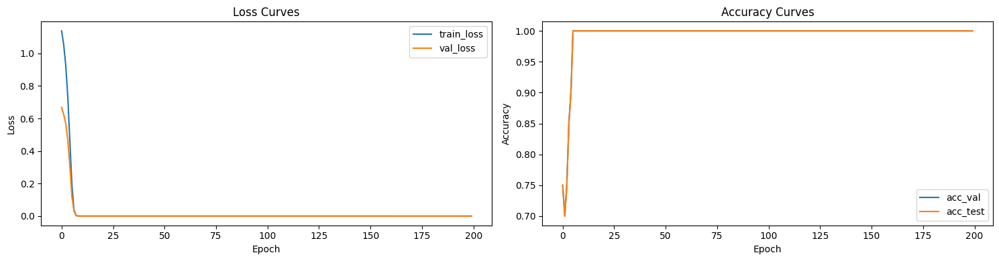

训练 n_layers=2, target_params=1000000
实际参数数量: 999169
Epoch | Train Loss |  Val Loss |  Val Acc |  Test Acc
--------------------------------------------------


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

    1 |     1.1323 |    0.6622 |   0.6000 |    0.6000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    2 |     1.0268 |    0.6299 |   0.6500 |    0.6500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    3 |     0.8755 |    0.5549 |   0.7500 |    0.7500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    4 |     0.6092 |    0.4453 |   0.8000 |    0.8000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    5 |     0.2993 |    0.2634 |   0.8500 |    0.8500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    6 |     0.0667 |    0.1052 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    7 |     0.0062 |    0.0233 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    8 |     0.0009 |    0.0032 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    9 |     0.0001 |    0.0003 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   10 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   11 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   12 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   13 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   14 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   15 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   16 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   17 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   18 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   19 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   20 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   21 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   22 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   23 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   24 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   25 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   26 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   27 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   28 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   29 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   30 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   31 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   32 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   33 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   34 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   35 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   36 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   37 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   38 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   39 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   40 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   41 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   42 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   43 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   44 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   45 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   46 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   47 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   48 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   49 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   50 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   51 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   52 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   53 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   54 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   55 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   56 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   57 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   58 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   59 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   60 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   61 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   62 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   63 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   64 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   65 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   66 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   67 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   68 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   69 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   70 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   71 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   72 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   73 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   74 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   75 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   76 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   77 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   78 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   79 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   80 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   81 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   82 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   83 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   84 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   85 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   86 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   87 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   88 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   89 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   90 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   91 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   92 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   93 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   94 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   95 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   96 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   97 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   98 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   99 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  100 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  101 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  102 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  103 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  104 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  105 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  106 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  107 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  108 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  109 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  110 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  111 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  112 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  113 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  114 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  115 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  116 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  117 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  118 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  119 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  120 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  121 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  122 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  123 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  124 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  125 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  126 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  127 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  128 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  129 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  130 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  131 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  132 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  133 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  134 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  135 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  136 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  137 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  138 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  139 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  140 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  141 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  142 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  143 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  144 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  145 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  146 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  147 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  148 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  149 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  150 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  151 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  152 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  153 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  154 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  155 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  156 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  157 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  158 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  159 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  160 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  161 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  162 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  163 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  164 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  165 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  166 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  167 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  168 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  169 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  170 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  171 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  172 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  173 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  174 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  175 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  176 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  177 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  178 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  179 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  180 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  181 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  182 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  183 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  184 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  185 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  186 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  187 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  188 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  189 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  190 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  191 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  192 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  193 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  194 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  195 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  196 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  197 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  198 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  199 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  200 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


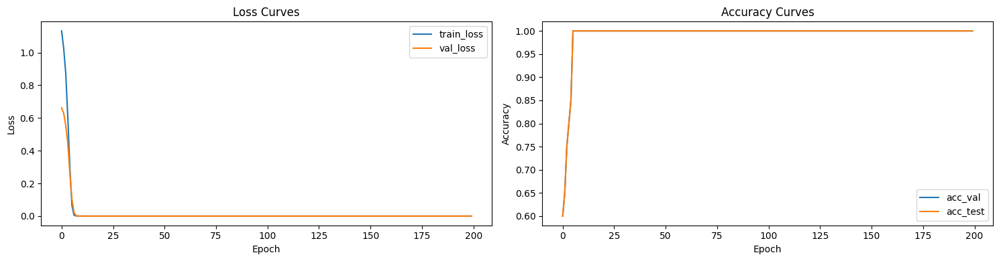

  0%|          | 0/3 [00:00<?, ?it/s]

训练 n_layers=3, target_params=100000
实际参数数量: 100434
Epoch | Train Loss |  Val Loss |  Val Acc |  Test Acc
--------------------------------------------------


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

    1 |     1.1483 |    0.6812 |   0.7500 |    0.7500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    2 |     1.1216 |    0.6679 |   0.7500 |    0.7500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    3 |     1.0919 |    0.6499 |   0.8000 |    0.8000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    4 |     1.0485 |    0.6205 |   0.8000 |    0.8000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    5 |     0.9809 |    0.5691 |   0.7500 |    0.7500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    6 |     0.8847 |    0.5096 |   0.7000 |    0.7000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    7 |     0.7745 |    0.4411 |   0.7500 |    0.7500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    8 |     0.6332 |    0.3438 |   0.8500 |    0.8500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    9 |     0.4956 |    0.2854 |   0.8500 |    0.8500 *


  0%|          | 0/3 [00:00<?, ?it/s]

   10 |     0.3799 |    0.1869 |   0.9000 |    0.9000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   11 |     0.2740 |    0.1219 |   0.9000 |    0.9000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   12 |     0.1730 |    0.0673 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   13 |     0.0785 |    0.0780 |   0.9500 |    0.9500


  0%|          | 0/3 [00:00<?, ?it/s]

   14 |     0.0205 |    0.0056 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   15 |     0.0045 |    0.0020 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   16 |     0.0016 |    0.0007 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   17 |     0.0010 |    0.0004 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   18 |     0.0006 |    0.0004 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   19 |     0.0004 |    0.0003 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   20 |     0.0002 |    0.0001 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   21 |     0.0001 |    0.0001 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   22 |     0.0001 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   23 |     0.0001 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   24 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   25 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   26 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   27 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   28 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   29 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   30 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   31 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   32 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   33 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   34 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   35 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   36 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   37 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   38 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   39 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   40 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   41 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   42 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   43 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   44 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   45 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   46 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   47 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   48 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   49 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   50 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   51 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   52 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   53 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   54 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   55 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   56 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   57 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   58 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   59 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   60 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   61 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   62 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   63 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   64 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   65 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   66 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   67 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   68 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   69 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   70 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   71 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   72 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   73 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   74 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   75 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   76 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   77 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   78 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   79 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   80 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   81 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   82 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   83 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   84 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   85 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   86 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   87 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   88 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   89 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   90 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   91 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   92 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   93 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   94 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   95 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   96 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   97 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   98 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   99 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  100 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  101 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  102 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  103 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  104 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  105 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  106 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  107 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  108 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  109 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  110 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  111 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  112 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  113 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  114 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  115 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  116 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  117 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  118 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  119 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  120 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  121 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  122 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  123 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  124 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  125 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  126 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  127 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  128 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  129 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  130 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  131 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  132 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  133 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  134 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  135 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  136 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  137 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  138 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  139 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  140 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  141 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  142 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  143 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  144 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  145 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  146 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  147 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  148 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  149 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  150 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  151 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  152 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  153 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  154 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  155 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  156 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  157 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  158 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  159 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  160 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  161 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  162 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  163 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  164 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  165 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  166 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  167 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  168 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  169 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  170 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  171 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  172 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  173 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  174 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  175 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  176 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  177 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  178 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  179 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  180 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  181 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  182 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  183 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  184 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  185 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  186 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  187 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  188 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  189 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  190 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  191 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  192 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  193 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  194 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  195 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  196 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  197 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  198 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  199 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  200 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


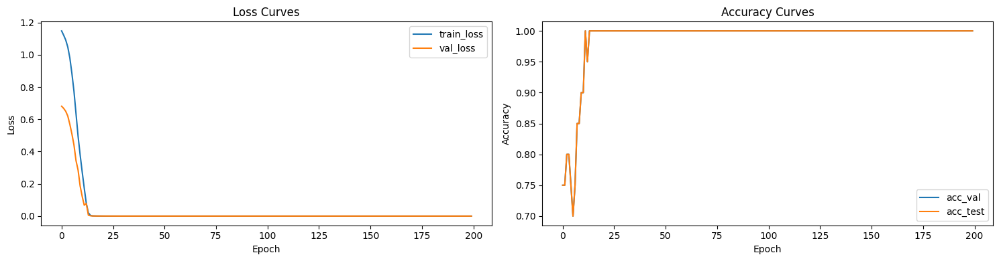

训练 n_layers=3, target_params=500000
实际参数数量: 500220
Epoch | Train Loss |  Val Loss |  Val Acc |  Test Acc
--------------------------------------------------


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

    1 |     1.1434 |    0.6718 |   0.6000 |    0.6000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    2 |     1.0834 |    0.6316 |   0.6500 |    0.6500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    3 |     0.9659 |    0.6512 |   0.6500 |    0.6500


  0%|          | 0/3 [00:00<?, ?it/s]

    4 |     0.7747 |    0.5806 |   0.7000 |    0.7000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    5 |     0.5708 |    0.5795 |   0.7000 |    0.7000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    6 |     0.4021 |    0.5756 |   0.7000 |    0.7000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    7 |     0.2291 |    0.4490 |   0.8000 |    0.8000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    8 |     0.0891 |    0.5516 |   0.8000 |    0.8000


  0%|          | 0/3 [00:00<?, ?it/s]

    9 |     0.0205 |    0.4464 |   0.8500 |    0.8500 *


  0%|          | 0/3 [00:00<?, ?it/s]

   10 |     0.0030 |    0.4226 |   0.9000 |    0.9000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   11 |     0.0015 |    0.5279 |   0.9000 |    0.9000


  0%|          | 0/3 [00:00<?, ?it/s]

   12 |     0.0004 |    0.3213 |   0.9000 |    0.9000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   13 |     0.0003 |    0.1507 |   0.9000 |    0.9000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   14 |     0.0002 |    0.0109 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   15 |     0.0001 |    0.0004 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   16 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   17 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   18 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   19 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   20 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   21 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   22 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   23 |     0.0000 |    0.0000 |   1.0000 |    1.0000
学习率降低至 0.0001


  0%|          | 0/3 [00:00<?, ?it/s]

   24 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   25 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   26 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   27 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   28 |     0.0000 |    0.0000 |   1.0000 |    1.0000
学习率降低至 1e-05


  0%|          | 0/3 [00:00<?, ?it/s]

   29 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   30 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   31 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   32 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   33 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   34 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   35 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   36 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   37 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   38 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   39 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   40 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   41 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   42 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   43 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   44 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   45 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   46 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   47 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   48 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   49 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   50 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   51 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   52 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   53 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   54 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   55 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   56 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   57 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   58 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   59 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   60 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   61 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   62 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   63 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   64 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   65 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   66 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   67 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   68 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   69 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   70 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   71 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   72 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   73 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   74 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   75 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   76 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   77 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   78 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   79 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   80 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   81 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   82 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   83 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   84 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   85 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   86 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   87 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   88 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   89 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   90 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   91 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   92 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   93 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   94 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   95 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   96 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   97 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   98 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   99 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  100 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  101 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  102 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  103 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  104 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  105 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  106 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  107 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  108 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  109 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  110 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  111 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  112 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  113 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  114 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  115 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  116 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  117 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  118 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  119 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  120 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  121 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  122 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  123 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  124 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  125 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  126 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  127 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  128 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  129 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  130 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  131 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  132 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  133 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  134 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  135 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  136 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  137 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  138 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  139 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  140 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  141 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  142 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  143 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  144 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  145 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  146 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  147 |     0.0000 |    0.0000 |   1.0000 |    1.0000
学习率降低至 1.0000000000000002e-06


  0%|          | 0/3 [00:00<?, ?it/s]

  148 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  149 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  150 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  151 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  152 |     0.0000 |    0.0000 |   1.0000 |    1.0000
学习率降低至 1.0000000000000002e-07


  0%|          | 0/3 [00:00<?, ?it/s]

  153 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  154 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  155 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  156 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  157 |     0.0000 |    0.0000 |   1.0000 |    1.0000
学习率降低至 1.0000000000000002e-08


  0%|          | 0/3 [00:00<?, ?it/s]

  158 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  159 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  160 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  161 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

  162 |     0.0000 |    0.0000 |   1.0000 |    1.0000
早停于第 162 轮


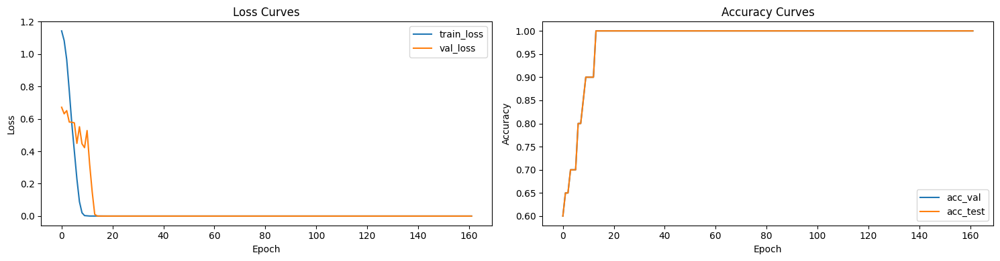

训练 n_layers=3, target_params=1000000
实际参数数量: 997195
Epoch | Train Loss |  Val Loss |  Val Acc |  Test Acc
--------------------------------------------------


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

    1 |     1.1306 |    0.6499 |   0.7000 |    0.7000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    2 |     0.9953 |    0.6544 |   0.7000 |    0.7000


  0%|          | 0/3 [00:00<?, ?it/s]

    3 |     0.7738 |    0.5132 |   0.7500 |    0.7500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    4 |     0.5173 |    0.4179 |   0.8000 |    0.8000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    5 |     0.3107 |    0.3214 |   0.8500 |    0.8500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    6 |     0.1235 |    0.3847 |   0.8500 |    0.8500


  0%|          | 0/3 [00:00<?, ?it/s]

    7 |     0.0255 |    0.1379 |   0.9500 |    0.9500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    8 |     0.0036 |    0.1402 |   0.9500 |    0.9500


  0%|          | 0/3 [00:00<?, ?it/s]

    9 |     0.0021 |    0.1296 |   0.9500 |    0.9500 *


  0%|          | 0/3 [00:00<?, ?it/s]

   10 |     0.0007 |    0.0172 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   11 |     0.0000 |    0.0003 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   12 |     0.0000 |    0.0002 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   13 |     0.0000 |    0.0001 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   14 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   15 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   16 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   17 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   18 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   19 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   20 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   21 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   22 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   23 |     0.0000 |    0.0000 |   1.0000 |    1.0000
学习率降低至 0.0001


  0%|          | 0/3 [00:00<?, ?it/s]

   24 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   25 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   26 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   27 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   28 |     0.0000 |    0.0000 |   1.0000 |    1.0000
学习率降低至 1e-05


  0%|          | 0/3 [00:00<?, ?it/s]

   29 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   30 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   31 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   32 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   33 |     0.0000 |    0.0000 |   1.0000 |    1.0000
学习率降低至 1.0000000000000002e-06


  0%|          | 0/3 [00:00<?, ?it/s]

   34 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   35 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   36 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   37 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   38 |     0.0000 |    0.0000 |   1.0000 |    1.0000
早停于第 38 轮


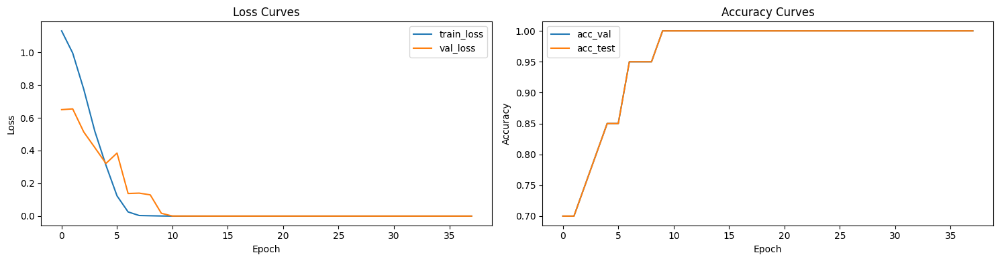

  0%|          | 0/3 [00:00<?, ?it/s]

训练 n_layers=4, target_params=100000
实际参数数量: 100063
Epoch | Train Loss |  Val Loss |  Val Acc |  Test Acc
--------------------------------------------------


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

    1 |     1.1506 |    0.6835 |   0.5500 |    0.5500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    2 |     1.1198 |    0.6664 |   0.8000 |    0.8000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    3 |     1.0822 |    0.6365 |   0.7500 |    0.7500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    4 |     1.0215 |    0.5743 |   0.6500 |    0.6500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    5 |     0.9138 |    0.6724 |   0.6500 |    0.6500


  0%|          | 0/3 [00:00<?, ?it/s]

    6 |     0.8193 |    0.4985 |   0.7500 |    0.7500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    7 |     0.7109 |    0.4159 |   0.7500 |    0.7500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    8 |     0.6137 |    0.3424 |   0.7500 |    0.7500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    9 |     0.5003 |    0.2895 |   0.8000 |    0.8000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   10 |     0.3928 |    0.1936 |   0.9500 |    0.9500 *


  0%|          | 0/3 [00:00<?, ?it/s]

   11 |     0.2707 |    0.1039 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   12 |     0.1445 |    0.0613 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   13 |     0.0621 |    0.0254 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   14 |     0.0291 |    0.0173 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   15 |     0.0118 |    0.0073 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   16 |     0.0037 |    0.0035 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   17 |     0.0021 |    0.0011 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   18 |     0.0013 |    0.0005 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   19 |     0.0007 |    0.0003 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   20 |     0.0004 |    0.0002 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   21 |     0.0002 |    0.0001 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   22 |     0.0002 |    0.0001 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   23 |     0.0001 |    0.0001 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   24 |     0.0001 |    0.0001 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   25 |     0.0001 |    0.0001 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   26 |     0.0001 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   27 |     0.0001 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   28 |     0.0001 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   29 |     0.0001 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   30 |     0.0001 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   31 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   32 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   33 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   34 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   35 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   36 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   37 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   38 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   39 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   40 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   41 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   42 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   43 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   44 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   45 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   46 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   47 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   48 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   49 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   50 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   51 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   52 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   53 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   54 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   55 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   56 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   57 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   58 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   59 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   60 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   61 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   62 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   63 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   64 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   65 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   66 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   67 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   68 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   69 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   70 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   71 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   72 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   73 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   74 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   75 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   76 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   77 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   78 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   79 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   80 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   81 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   82 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   83 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   84 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   85 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   86 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   87 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   88 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   89 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   90 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   91 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   92 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   93 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   94 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   95 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   96 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   97 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   98 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   99 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  100 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  101 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  102 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  103 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  104 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  105 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  106 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  107 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  108 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  109 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  110 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  111 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  112 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  113 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  114 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  115 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  116 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  117 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  118 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  119 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  120 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  121 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  122 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  123 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  124 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  125 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  126 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  127 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  128 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  129 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  130 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  131 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  132 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  133 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  134 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  135 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  136 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  137 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  138 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  139 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  140 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  141 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  142 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  143 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  144 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  145 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  146 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  147 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  148 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  149 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  150 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  151 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  152 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  153 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  154 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  155 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  156 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  157 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  158 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  159 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  160 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  161 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  162 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  163 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  164 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  165 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  166 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  167 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  168 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  169 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  170 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  171 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  172 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  173 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  174 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  175 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  176 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  177 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  178 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  179 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  180 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  181 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  182 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  183 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  184 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  185 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  186 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  187 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  188 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  189 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  190 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  191 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  192 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  193 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  194 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  195 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  196 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  197 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  198 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  199 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  200 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


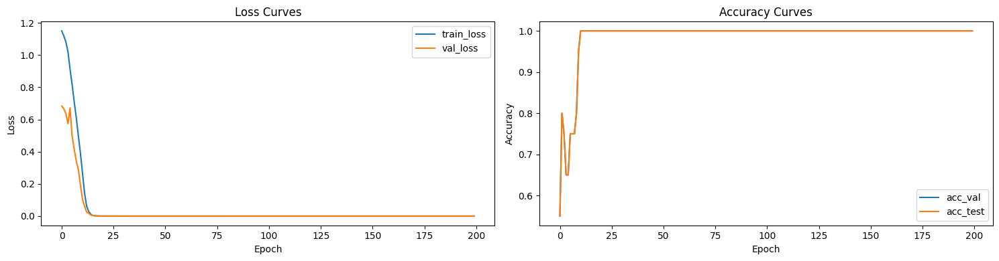

训练 n_layers=4, target_params=500000
实际参数数量: 501947
Epoch | Train Loss |  Val Loss |  Val Acc |  Test Acc
--------------------------------------------------


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

    1 |     1.1447 |    0.6722 |   0.7500 |    0.7500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    2 |     1.0730 |    0.6069 |   0.6500 |    0.6500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    3 |     0.9201 |    0.5807 |   0.7000 |    0.7000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    4 |     0.7590 |    0.4557 |   0.7000 |    0.7000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    5 |     0.5890 |    0.4132 |   0.7000 |    0.7000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    6 |     0.4315 |    0.2960 |   0.9500 |    0.9500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    7 |     0.2753 |    0.2210 |   0.9000 |    0.9000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    8 |     0.1285 |    0.1629 |   0.9500 |    0.9500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    9 |     0.0390 |    0.0590 |   0.9500 |    0.9500 *


  0%|          | 0/3 [00:00<?, ?it/s]

   10 |     0.0055 |    0.0034 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   11 |     0.0018 |    0.0021 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   12 |     0.0004 |    0.0012 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   13 |     0.0003 |    0.0009 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   14 |     0.0002 |    0.0015 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   15 |     0.0000 |    0.0018 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   16 |     0.0000 |    0.0011 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   17 |     0.0000 |    0.0005 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   18 |     0.0000 |    0.0002 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   19 |     0.0000 |    0.0001 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   20 |     0.0000 |    0.0001 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   21 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   22 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   23 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   24 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   25 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   26 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   27 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   28 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   29 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   30 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   31 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   32 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   33 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   34 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   35 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   36 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   37 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   38 |     0.0000 |    0.0000 |   1.0000 |    1.0000
学习率降低至 0.0001


  0%|          | 0/3 [00:00<?, ?it/s]

   39 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   40 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   41 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   42 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   43 |     0.0000 |    0.0000 |   1.0000 |    1.0000
学习率降低至 1e-05


  0%|          | 0/3 [00:00<?, ?it/s]

   44 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   45 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   46 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   47 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   48 |     0.0000 |    0.0000 |   1.0000 |    1.0000
学习率降低至 1.0000000000000002e-06


  0%|          | 0/3 [00:00<?, ?it/s]

   49 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   50 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   51 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   52 |     0.0000 |    0.0000 |   1.0000 |    1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

   53 |     0.0000 |    0.0000 |   1.0000 |    1.0000
早停于第 53 轮


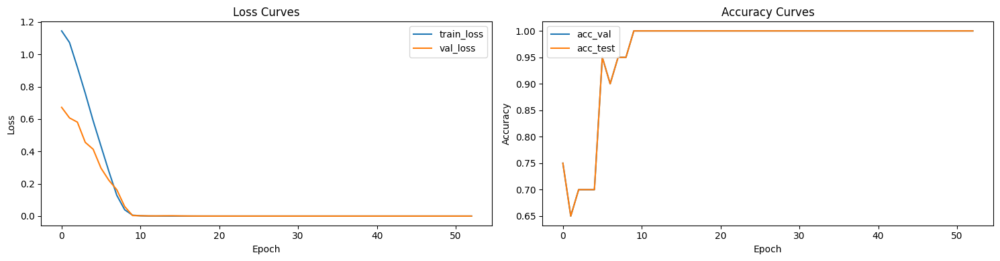

训练 n_layers=4, target_params=1000000
实际参数数量: 998839
Epoch | Train Loss |  Val Loss |  Val Acc |  Test Acc
--------------------------------------------------


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

    1 |     1.1293 |    0.6611 |   0.7500 |    0.7500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    2 |     1.0299 |    0.6152 |   0.6500 |    0.6500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    3 |     0.8767 |    0.5476 |   0.8500 |    0.8500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    4 |     0.6286 |    0.4121 |   0.8500 |    0.8500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    5 |     0.3237 |    0.2258 |   0.9500 |    0.9500 *


  0%|          | 0/3 [00:00<?, ?it/s]

    6 |     0.0881 |    0.0778 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    7 |     0.0101 |    0.0310 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    8 |     0.0007 |    0.0100 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

    9 |     0.0001 |    0.0019 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   10 |     0.0000 |    0.0003 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   11 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   12 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   13 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   14 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   15 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   16 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   17 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   18 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   19 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   20 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   21 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   22 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   23 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   24 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   25 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   26 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   27 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   28 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   29 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   30 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   31 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   32 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   33 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   34 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   35 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   36 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   37 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   38 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   39 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   40 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   41 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   42 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   43 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   44 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   45 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   46 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   47 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   48 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   49 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   50 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   51 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   52 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   53 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   54 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   55 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   56 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   57 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   58 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   59 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   60 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   61 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   62 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   63 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   64 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   65 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   66 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   67 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   68 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   69 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   70 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   71 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   72 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   73 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   74 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   75 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   76 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   77 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   78 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   79 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   80 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   81 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   82 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   83 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   84 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   85 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   86 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   87 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   88 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   89 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   90 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   91 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   92 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   93 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   94 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   95 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   96 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   97 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   98 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

   99 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  100 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  101 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  102 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  103 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  104 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  105 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  106 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  107 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  108 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  109 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  110 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  111 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  112 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  113 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  114 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  115 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  116 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  117 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  118 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  119 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  120 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  121 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  122 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  123 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  124 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  125 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  126 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  127 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  128 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  129 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  130 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  131 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  132 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  133 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  134 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  135 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  136 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  137 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  138 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  139 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  140 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  141 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  142 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  143 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  144 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  145 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  146 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  147 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  148 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  149 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  150 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  151 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  152 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  153 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  154 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  155 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  156 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  157 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  158 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  159 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  160 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  161 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  162 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  163 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  164 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  165 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  166 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  167 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  168 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  169 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  170 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  171 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  172 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  173 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  174 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  175 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  176 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  177 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  178 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  179 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  180 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  181 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  182 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  183 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  184 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  185 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  186 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  187 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  188 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  189 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  190 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  191 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  192 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  193 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  194 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  195 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  196 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  197 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  198 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  199 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


  0%|          | 0/3 [00:00<?, ?it/s]

  200 |     0.0000 |    0.0000 |   1.0000 |    1.0000 *


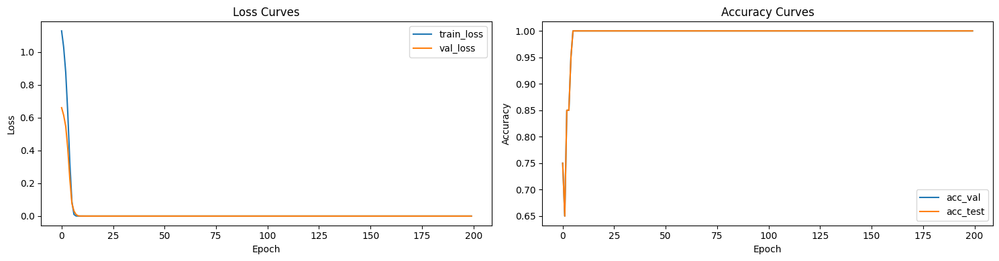

In [9]:
def train_euclidnet(n_layers, target_params):
    """训练EuclidNet模型的完整函数"""
    gc.collect()
    torch.cuda.empty_cache()
    print(f"Training n_layers={n_layers}, target_params={target_params}")

    # 根据目标参数数量找到合适的hidden_size
    def objective(h):
        hparams = {
            "n_input": 3,      # 3D坐标
            "n_output": 1,     # 边分类
            "n_hidden": int(h),
            "n_layers": n_layers,
            "c_weight": 1.0
        }
        return count_parameters(EuclidNet(hparams)) - target_params

    optimal_h = int(root_scalar(objective, bracket=[1, 1000], method='bisect').root)

    # 选择最接近目标参数数量的hidden_size
    candidates = {optimal_h-1, optimal_h, optimal_h+1}
    best_h = min(candidates, key=lambda h: abs(objective(h)) if h > 0 else float('inf'))

    # 创建模型
    hparams = {
        "n_input": 3,
        "n_output": 1,
        "n_hidden": best_h,
        "n_layers": n_layers,
        "c_weight": 1.0
    }

    model = EuclidNet(hparams).to(device)
    print(f"Actual amount of parameter: {count_parameters(model)}")

    lr = LR
    optimizer = optim.Adam(model.parameters(), lr=lr)
    best_val_loss = float('inf')
    epochs_no_improve, epochs_no_improve2 = 0, 0
    stats = []
    best = None

    # 打印表头
    print(f"{'Epoch':>5} | {'Train Loss':>10} | {'Val Loss':>9} | {'Val Acc':>8} | {'Test Acc':>9}")
    print("-" * 50)

    for epoch in trange(MAX_EPOCHS):
        train_loss = train_epoch(model, loader_train, optimizer)
        preds_val, actuals_val, acc_val, val_loss = evaluate(model, loader_val)
        preds_test, actuals_test, acc_test, test_loss = evaluate(model, loader_test)

        stats.append({
            'train_loss': train_loss,
            'val_loss': val_loss,
            'acc_val': acc_val,
            'acc_test': acc_test
        })

        if val_loss < best_val_loss:
            print(f"{epoch+1:5d} | {train_loss:10.4f} | {val_loss:9.4f} | {acc_val:8.4f} | {acc_test:9.4f} *")
            best_val_loss = val_loss
            epochs_no_improve = 0
            epochs_no_improve2 = 0
            best = {
                'model_state': {k: v.cpu() for k, v in model.state_dict().items()},
                'preds_test': preds_test,
                'preds_val': preds_val,
                'hparams': hparams
            }
        else:
            print(f"{epoch+1:5d} | {train_loss:10.4f} | {val_loss:9.4f} | {acc_val:8.4f} | {acc_test:9.4f}")
            epochs_no_improve += 1
            epochs_no_improve2 += 1

        # 早停
        if epochs_no_improve >= TOLERANCE:
            print(f"Early stop at {epoch+1} round")
            break

        # 学习率衰减
        if epochs_no_improve2 >= LR_TOLERANCE:
            if lr >= 1.0e-8:
                lr /= 10
                for param_group in optimizer.param_groups:
                    param_group['lr'] = lr
                print(f"LR decreases to {lr}")
                epochs_no_improve2 = 0

    best['stats'] = stats

    # 保存结果
    os.makedirs(PATH_DATA, exist_ok=True)
    joblib.dump(best, os.path.join(PATH_DATA, f"euclidnet_{n_layers}_{target_params}.pkl"))

    # 绘制训练曲线
    stats_df = pd.DataFrame(stats)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 4))

    stats_df[['train_loss', 'val_loss']].plot(ax=ax1, title='Loss Curves')
    ax1.set_ylabel('Loss')
    ax1.set_xlabel('Epoch')

    stats_df[['acc_val', 'acc_test']].plot(ax=ax2, title='Accuracy Curves')
    ax2.set_ylabel('Accuracy')
    ax2.set_xlabel('Epoch')

    plt.tight_layout()
    plt.show()

    # 清理内存
    del model, optimizer
    gc.collect()
    torch.cuda.empty_cache()

    return best

# 执行训练
for n_layers in tqdm([2, 3, 4]):
    for target_params in tqdm([100_000, 500_000, 1_000_000]):
        train_euclidnet(n_layers, target_params)

# Summary of Results

In [10]:
val = pd.read_pickle(os.path.join(PATH_DATA0, 'graphs','max_prob_10_subsample_0.1','graphs_val.pkl'))
test = pd.read_pickle(os.path.join(PATH_DATA0, 'graphs','max_prob_10_subsample_0.1','graphs_test.pkl'))
# 🔥 修复：检查数据类型并正确提取标签
if isinstance(val, list):
    val_y = torch.cat([i.y for i in val]).numpy()
    test_y = torch.cat([i.y for i in test]).numpy()
else:
    # 如果是字典格式
    val_y = torch.cat([i.y for i in val.values()]).numpy()
    test_y = torch.cat([i.y for i in test.values()]).numpy()

EuclidNet Results Summary:
                 test_accuracy  val_accuracy
#layers #params                             
2       100000             1.0           1.0
        500000             1.0           1.0
        1000000            1.0           1.0
3       100000             1.0           1.0
        500000             1.0           1.0
        1000000            1.0           1.0
4       100000             1.0           1.0
        500000             1.0           1.0
        1000000            1.0           1.0

Best model test accuracy: 1.000000
Best model validation accuracy: 1.000000


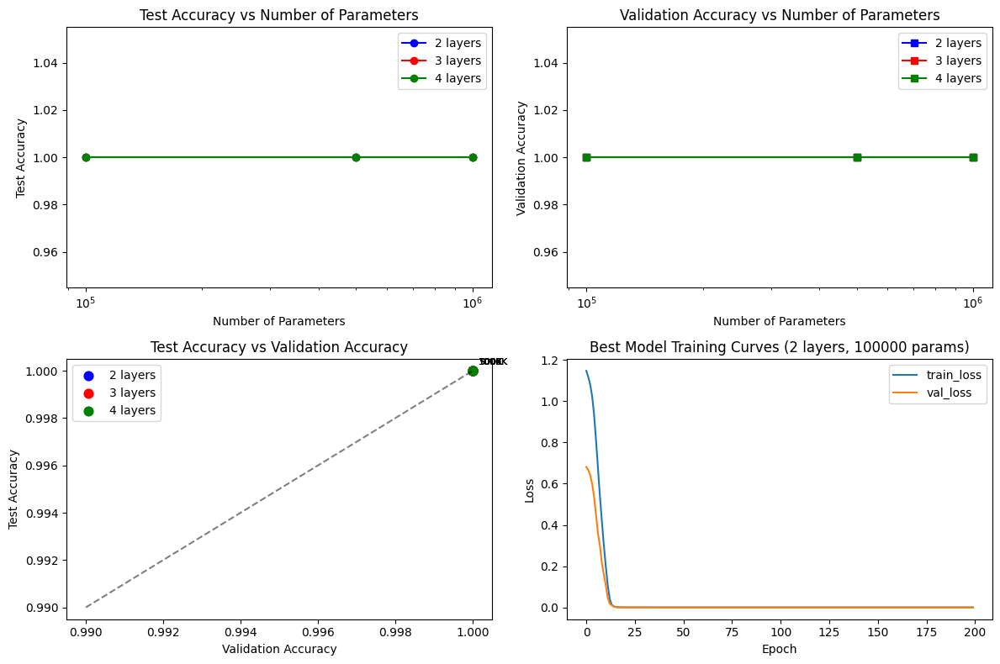

In [12]:
# Load validation and test set ground truth labels
val_data = pd.read_pickle(os.path.join(PATH_DATA0, 'graphs','max_prob_10_subsample_0.1','graphs_val.pkl'))
test_data = pd.read_pickle(os.path.join(PATH_DATA0, 'graphs','max_prob_10_subsample_0.1','graphs_test.pkl'))
val_y = torch.cat([graph.y for graph in val_data]).numpy()
test_y = torch.cat([graph.y for graph in test_data]).numpy()

# Collect all results
results = {}
for pkl_file in glob(os.path.join(PATH_DATA, 'euclidnet_*.pkl')):
    result = joblib.load(pkl_file)
    preds_test = (result['preds_test'] >= 0.5)
    preds_val = (result['preds_val'] >= 0.5)

    filename = os.path.basename(pkl_file).replace('.pkl', '')
    results[filename] = {
        'test_accuracy': (preds_test == test_y).astype(float).mean(),
        'val_accuracy': (preds_val == val_y).astype(float).mean()
    }

# Convert to DataFrame and sort
results_df = pd.DataFrame(results).T.sort_values('val_accuracy', ascending=False)

# Parse filenames into multi-level index
index_tuples = []
for filename in results_df.index:
    parts = filename.split('_')
    n_layers = parts[1]
    n_params = parts[2]
    index_tuples.append((n_layers, n_params))

results_df.index = pd.MultiIndex.from_tuples(index_tuples, names=['#layers', '#params'])

# Save results
results_df.to_csv(os.path.join(PATH_DATA, 'euclidnet_results.csv'))

print("EuclidNet Results Summary:")
print(results_df)

# Print best results
best_result = results_df.iloc[0]
print(f"\nBest model test accuracy: {best_result['test_accuracy']:.6f}")
print(f"Best model validation accuracy: {best_result['val_accuracy']:.6f}")

# Plot results visualization
plt.figure(figsize=(12, 8))

# Plot grouped by number of layers
layers = results_df.index.get_level_values(0).unique()
colors = ['blue', 'red', 'green', 'orange']

for i, layer in enumerate(layers):
    layer_data = results_df.loc[layer]
    params = [int(p) for p in layer_data.index]
    test_acc = layer_data['test_accuracy'].values
    val_acc = layer_data['val_accuracy'].values

    plt.subplot(2, 2, 1)
    plt.plot(params, test_acc, 'o-', color=colors[i], label=f'{layer} layers')
    plt.xlabel('Number of Parameters')
    plt.ylabel('Test Accuracy')
    plt.title('Test Accuracy vs Number of Parameters')
    plt.legend()
    plt.xscale('log')

    plt.subplot(2, 2, 2)
    plt.plot(params, val_acc, 's-', color=colors[i], label=f'{layer} layers')
    plt.xlabel('Number of Parameters')
    plt.ylabel('Validation Accuracy')
    plt.title('Validation Accuracy vs Number of Parameters')
    plt.legend()
    plt.xscale('log')

plt.subplot(2, 2, 3)
for i, layer in enumerate(layers):
    layer_data = results_df.loc[layer]
    params = [int(p) for p in layer_data.index]
    test_acc = layer_data['test_accuracy'].values
    val_acc = layer_data['val_accuracy'].values

    plt.scatter(val_acc, test_acc, color=colors[i], label=f'{layer} layers', s=60)

    # Add parameter count annotations
    for j, (v, t, p) in enumerate(zip(val_acc, test_acc, params)):
        plt.annotate(f'{p//1000}K', (v, t), xytext=(5, 5),
                    textcoords='offset points', fontsize=8)

plt.xlabel('Validation Accuracy')
plt.ylabel('Test Accuracy')
plt.title('Test Accuracy vs Validation Accuracy')
plt.legend()
plt.plot([0.99, 1.0], [0.99, 1.0], 'k--', alpha=0.5)

plt.subplot(2, 2, 4)
# Show training curves for best configuration
best_config = results_df.index[0]
best_file = f"euclidnet_{best_config[0]}_{best_config[1]}.pkl"
best_result = joblib.load(os.path.join(PATH_DATA, best_file))
best_stats = pd.DataFrame(best_result['stats'])

best_stats[['train_loss', 'val_loss']].plot(ax=plt.gca())
plt.title(f'Best Model Training Curves ({best_config[0]} layers, {best_config[1]} params)')
plt.xlabel('Epoch')
plt.ylabel('Loss')

plt.tight_layout()
plt.show()